<a href="https://colab.research.google.com/github/Munavvarh/CS-301-Intro-to-Data-Science-/blob/main/CS301_Assignment1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Probability Assignment

To get full credit in this assignment you need to use only `numpy` or `numba` libraries  and include adequate explanation of the code in either markdown cells or code comments. Sometimes you need to type equations - type equations in latex math notation. 


## Question 1 (20 points)

Generate N uniform distributed over the interval [0,1] random variables $\{x_1, \dots x_N\}$. 

Compute their mean and after repeating such computation $m$ times, plot the  histogram as $N$ takes values ${1, 5, 10, 20}$. 

Provide a justification of the resultant histogram by reading about the [Cenral Limit Theorem](https://en.wikipedia.org/wiki/Central_limit_theorem). 

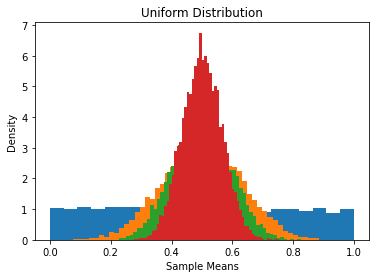

In [ ]:
import numpy as np
import matplotlib.pyplot as plt




# attributes
N = [1, 5, 10, 20]
list_of_means = []
n_bins = 'auto'

#Generate N uniform distributed over the interval [0,1] random variables  {x1,…xN} .

for val in N:
  x = np.random.uniform(0, 1, (10000, val))
  mean_of_list = np.mean(x, axis=1)
  list_of_means.append(mean_of_list)


for m in list_of_means:
  plt.hist(m, n_bins, density=True, histtype='bar', stacked=True)


plt.title("Uniform Distribution")
plt.xlabel("Sample Means")
plt.ylabel("Density")
plt.show()


"""

The rule of large numbers states that as sample size grows, the mean approaches the sample total.
The central limit theorem goes one step further by demonstrating that the sample mean's distribution 
closely resembles a normal distribution and thus the sample value roughly approximates the population value.
The distribution of sample means for varying data sizes is shown in the histogram below. The distribution of 
sample means moves closer to a normal distribution as sample size rises. This is due to the central limit theorem.


"""










## Question 2 (20 points) 

The exercise refers to Example 6.6 of the  [Math for ML book](https://mml-book.github.io/book/mml-book.pdf). 

Simulate and plot the bivariate normal distribution with the shown parameters. 

You need to use the [Cholesky factorization](https://numpy.org/doc/stable/reference/generated/numpy.linalg.cholesky.html) for the simulation. 

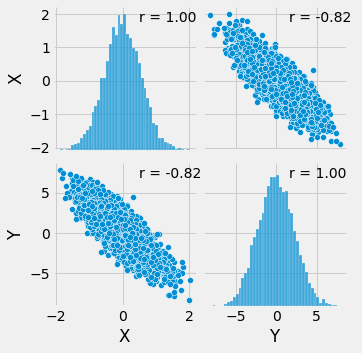

In [ ]:


import numpy as np
import matplotlib.pyplot as plt
import random
from scipy.linalg import cholesky
from scipy.stats import pearsonr 

import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('fivethirtyeight')
import seaborn as sns


covVal = np.array([[0.3, -1], [-1, 5]])
choVal = cholesky(covVal)               #Cholesky decomposition
ranVal = np.random.randn(5000,2)        #Two uncorrelated sequences
ranSeqVal = ranVal @ choVal             #Array of correlated random sequences


#compute and plot correlation coeff from generated sequences

def myFunc (x, y, **kws): 
    (r, _) = pearsonr(x, y)
    x = plt.gca()
    x.annotate("r = {:.2f} ".format(r),xy=(.6, .9), xycoords=x.transAxes)
    
#Plotting 
dfVal = pd.DataFrame(data=ranSeqVal, columns=['X','Y'])
myPlotVal = sns.pairplot(dfVal)
myPlotVal.map(myFunc)












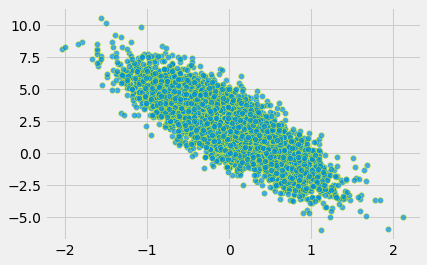

In [ ]:

# Also we can answer the following question number 2 using np.random.multivariate_normal function as shown below.

import numpy as np
import matplotlib.pyplot as plt
import random
from scipy.linalg import cholesky
from scipy.stats import pearsonr #to calculate correlation coefficient

meanVal = np.array([0, 2])
covVal = np.array([[0.3, -1], [-1, 5]])
sizeVal = 5000

x = np.random.multivariate_normal(meanVal,covVal, sizeVal)
plt.scatter(x[:,0], x[:,1], edgecolors='yellow', alpha=0.7)

## Question 3 (30 points)

1. Simulate coin tossing experiments involving a biased coin with probability of heads is $p_H=0.6$ and $n_{trials} = [0, 5, 15, 50, 500]$ (10 points)

2. Assume you don't know $p_H$ and you need to estimate it. Plot the estimate as a function of the number of trials. Comment on the accuracy of the estimate for small vs. large trials. (10 points)

3. Calculate the variance of the estimated $p_H$ (10 points). Comment on its behavior as a function of the true $p_H$ itself and the $n_{trials}$. 


For 0   trials   the  estimate of pH is 0
For 5   trials   the  estimate of pH is 0.6
For 15  trials   the  estimate of pH is 0.4666666666666667
For 50  trials   the  estimate of pH is 0.48
For 500 trials   the  estimate of pH is 0.542


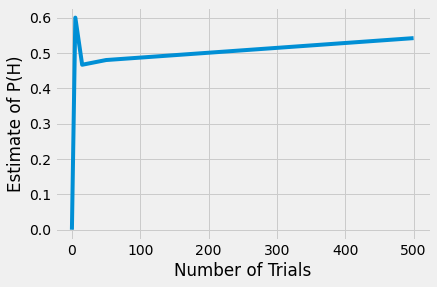

 The varriance of pH Estimate is listed below
0.045887217777777774


In [ ]:
# Type the Python code here

import numpy as np
import matplotlib.pyplot as plt
import random


# Getting heads out of number of trials in 0 and 1 format where 1 being head 

x1 = np.random.binomial(1, .6, 0)
x2 = np.random.binomial(1, .6, 5)
x3 = np.random.binomial(1, .6, 15)
x4 = np.random.binomial(1, .6, 50)
x5 = np.random.binomial(1, .6, 500)


# print([x1], [x2], [x3], [x4], [x5])   This shows 

# calculating pH estimate value

x1Prob = np.count_nonzero(x1 == 1) 
x2Prob = np.count_nonzero(x2 == 1)/5
x3Prob = np.count_nonzero(x3 == 1)/15
x4Prob = np.count_nonzero(x4 == 1)/50
x5Prob = np.count_nonzero(x5 == 1)/500






print("For 0   trials   the  estimate of pH is",  x1Prob  )
print("For 5   trials   the  estimate of pH is",  x2Prob  )
print("For 15  trials   the  estimate of pH is",  x3Prob  )
print("For 50  trials   the  estimate of pH is" , x4Prob  )
print("For 500 trials   the  estimate of pH is",  x5Prob  )


# plotting the data


plt.xlabel("Number of Trials")
plt.ylabel("Estimate of P(H)")
plt.plot([0, 5, 15, 50, 500], [x1Prob, x2Prob, x3Prob, x4Prob, x5Prob ])
plt.show()

#Comment on the accuracy of the estimate for small vs. large trials 
      # Answer : It is visible from the figure above that a high number of trials result in more precise pH estimate than a small number of trials.


# Getting Varriance of pH Estimate
phVar = np.var([[x1Prob],[ x2Prob], [x3Prob], [x4Prob], [x5Prob]])


print (" The varriance of pH Estimate is listed below")
print(phVar)

   
# In conclusion the result above shows that pH variance decreases as the number of n trials increases.



# Question 4 (30 points)

![](points-on-line.png)


1. We monitor server faults in a data center over a period of T units of time and represents each occurring fault as a point on the line. What is the probability that k faults take place between $t_1$ and $t_2$ if $n$ total points were recorded ?  (10 points)

2. We collected a very large set of faults $n \rightarrow \infty$ over a long measurement interval $T \rightarrow \infty$  and we observed that on average faults occur with a rate of $\lambda = \frac{n}{T}$.   This [allows us](https://en.wikipedia.org/wiki/Poisson_limit_theorem) to model the probability of $k_a$ points in an interval $t_a$ as [Poisson](https://en.wikipedia.org/wiki/Poisson_distribution).  Suppose that we measure $k_a$ and $k_b$ faults in two consecutive intervals of durations $t_a=(t_1, t_2)$ and $t_b=(t_2, t_3)$ respectively where $t_a+t_b < T$, write the expression of the joint probability $$p(k_a \in t_a, k_b \in t_b)$$. (10 points)

3. Suppose now that we need to schedule personnel to replace these servers and we are interested to use the fault data to estimate the probability of $$p(k_a \in t_a | k_c \in t_c)$$ where $t_c=t_a + t_b$. Write the expression of this conditional probability.  (10 points)

`Write your answer here and use Latex math notation for math. If you prefer write the math with pencil and scan the writeup in a png image that you can insert here using` 

```
![](your-png-file.png)
```


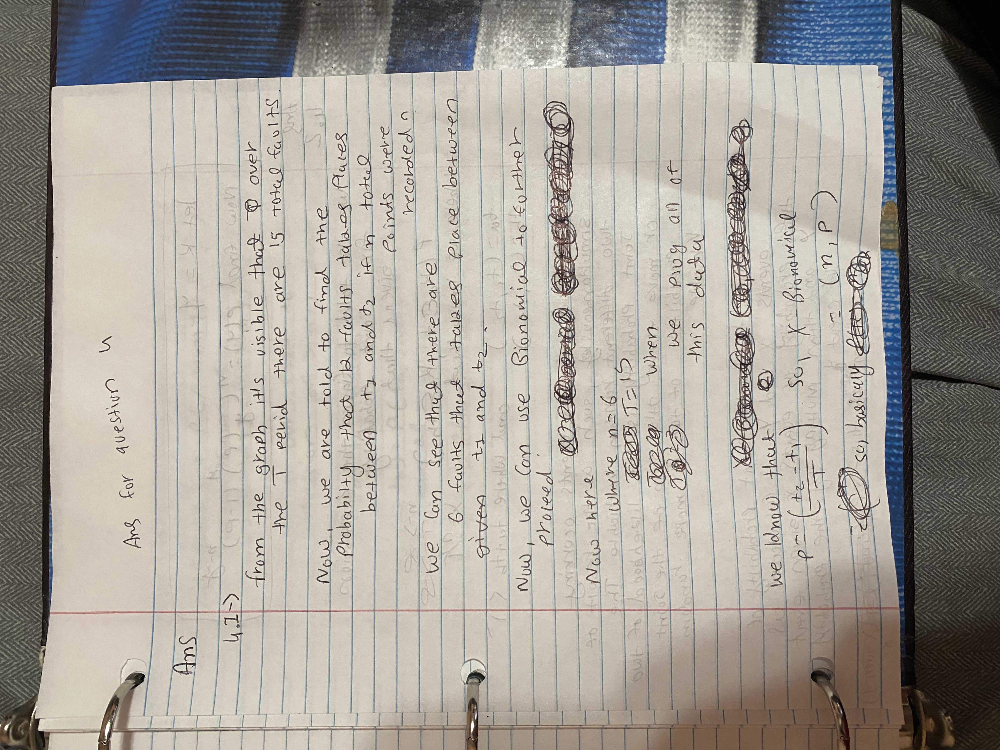

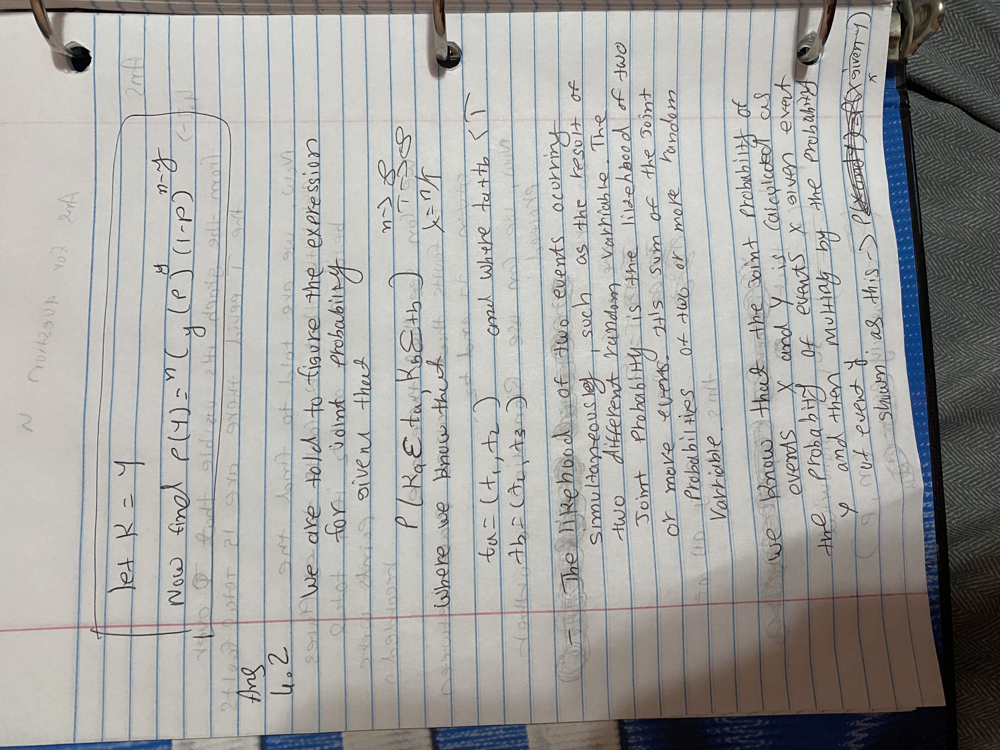

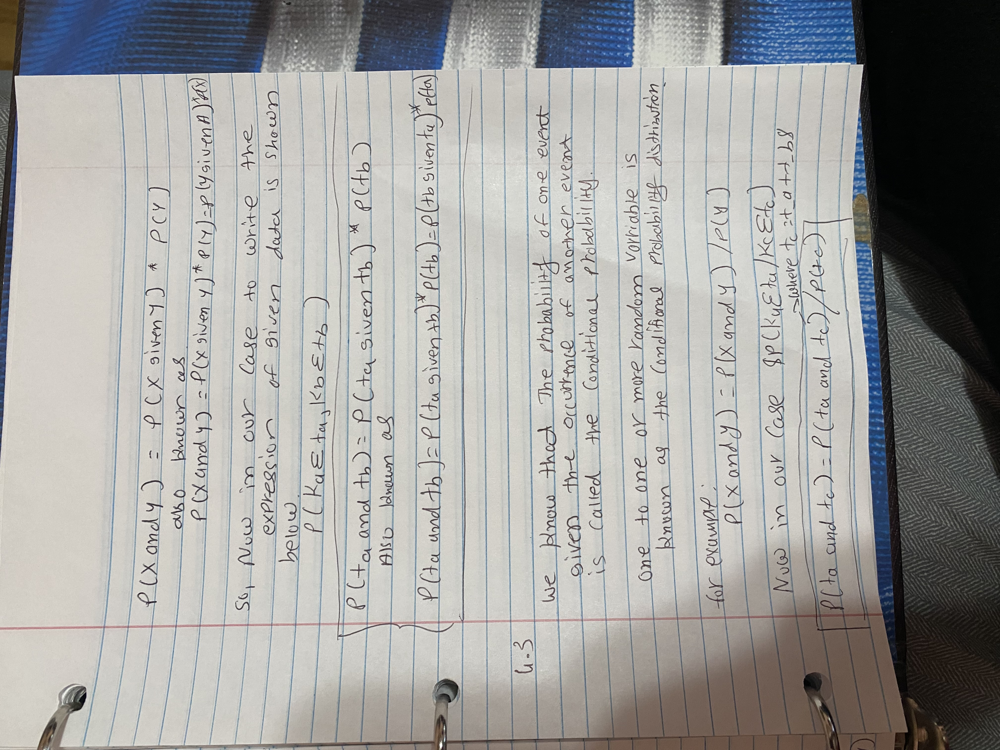

In [ ]:



from google.colab import files
from IPython.display import Image, display

display(Image('4.1 Answer.jpg', width=500))
display(Image('4.2 Answer.jpg', width=500))
display(Image('4.3 Answer.jpg', width=500))


